In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
#data = pd.read_csv('data/SCDB_2018_02_caseCentered_Citation.csv',encoding='ISO 8859-1')
data = pd.read_csv('../data/SCDB_2019_01_caseCentered_Citation.csv',encoding='ISO 8859-1')
#olddata = pd.read_csv('data/supreme_court.csv')
#olddata.columns = olddata.columns.str.replace('.','').str.replace(' ','')
data.shape

(8966, 53)

In [3]:
#Selecting all float columns, they should have been int cols, due to Null values they are designated as Float columns
float_columns = data.select_dtypes('float64').columns
#Replacing all null values with 9999 to convert the float columns to Int
data[float_columns] = data[float_columns].fillna(9999)
for col in float_columns:
    data[col] = data[col].astype('int')


In [4]:
date_columns = ['dateArgument','dateRearg','dateDecision']
for col in date_columns:
    data[col]=pd.to_datetime(data[col],errors='coerce')

In [5]:
#Issue Areas Labels, creating a dictionary and mapping it
issue_areas = ['Criminal Procedure','Civil Rights','First Amendment','Due Process','Privacy','Attorneys',
                'Unions','Economic Activity','Judicial Power','Federalism','Interstate Relations',
                'Federal Taxation','Miscellaneous','Private Action']
issue_areas_dict = dict(zip((range(1,15)),issue_areas))
data['mapissueArea']=data['issueArea'].map(issue_areas_dict)

In [6]:
len(data.columns)

54

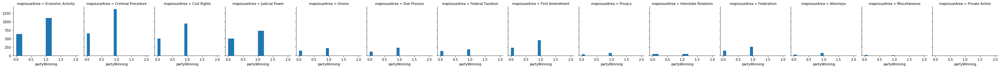

In [7]:
g = sns.FacetGrid(data, col='mapissueArea')
g.map(plt.hist,'partyWinning')

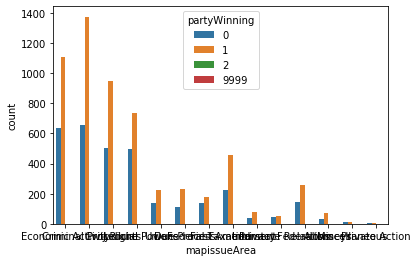

In [8]:
sns.countplot(x='mapissueArea',data=data,hue='partyWinning')

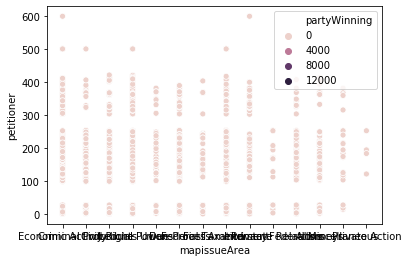

In [9]:
sns.scatterplot('mapissueArea','petitioner',data=data,hue='partyWinning')

In [10]:
data.groupby(['mapissueArea'])['mapissueArea'].count()

mapissueArea
Attorneys                102
Civil Rights            1450
Criminal Procedure      2029
Due Process              348
Economic Activity       1743
Federal Taxation         312
Federalism               406
First Amendment          680
Interstate Relations      99
Judicial Power          1232
Miscellaneous             24
Privacy                  116
Private Action             4
Unions                   361
Name: mapissueArea, dtype: int64

In [11]:
parties_labels = {-1: 'Others',
                 28: 'State',
                 27: 'United States',
                 100: 'Person accused of crime',
                 126: 'Person convicted of crime',
                 19: 'Govt Official',
                 145: 'Employee',
                 151: 'Employer',
                 249: 'Union',
                 8: 'Govt Employee',
                 3: 'City,Town or Govt Unit',
                 106: 'Alien',
                 215: 'Prisoner',
                 382: 'Labor Board',
                 195: 'Owner',
                 240: 'Taxpayer'}

In [12]:
issues_cat = data['mapissueArea'].value_counts().reset_index()
issues_cat['pct_cases']=np.round(100*data['mapissueArea'].value_counts(normalize=True).values,2).astype(str)
issues_cat['pct_cases']=issues_cat['pct_cases']+'%'
fig = px.bar(issues_cat,y='mapissueArea',x='index',hover_name='pct_cases',
             color_discrete_sequence=px.colors.qualitative.Prism,
             text='pct_cases',
             labels={'index':'Issue Area','mapissueArea':'No. of Cases'}
             )
fig.show()

In [13]:
#what type of people approach supreme court
#As there are 310 petitoner categories, converting to others for categories who do not come under top 15
petition_category = data['petitioner'].value_counts(ascending=False)[:15].index.values
data['petitioner_cat'] = data['petitioner'].apply(lambda x: x if x in petition_category else -1)


In [14]:
pet_cat = data['petitioner_cat'].value_counts(ascending=False).reset_index()
pet_cat['index']=pet_cat['index'].map(parties_labels)
pet_cat['pct_cases']=np.round(100*data['petitioner_cat'].value_counts(ascending=False,normalize=True).values,1).astype(str)
fig = px.bar(pet_cat,y='petitioner_cat',x='index',hover_name='pct_cases',
             text ='petitioner_cat',
             color_discrete_sequence=px.colors.qualitative.Prism,
             labels={'index':'Petitoners','petitioner_cat':'No. of Cases'},log_y=True)
fig.show()

In [15]:
#what type of people have to defend in the Supreme Court
respondent_category=data['respondent'].value_counts(ascending=False)[:15].index.values
data['respondent_cat'] = data['respondent'].apply(lambda x: x if x in respondent_category else -1)
rep_cat = data['respondent_cat'].value_counts(ascending=False).reset_index()
rep_cat['index']=rep_cat['index'].map(parties_labels)
rep_cat['pct_cases']=100*data['respondent_cat'].value_counts(ascending=False,normalize=True).values
fig = px.bar(rep_cat,x='index',y='respondent_cat',hover_name='pct_cases',color_discrete_sequence=px.colors.qualitative.Prism,
             labels={'index':'Respondents','respondent_cat':'No. of Cases'},log_y=True)
fig.show()

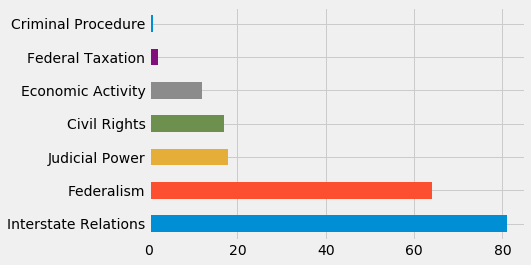

In [16]:
#Number of cases where State Govt and US Govt are head to head
plt.style.use('fivethirtyeight')
data[(data.respondent.isin([28,27])) & (data.petitioner.isin([28,27]))]['mapissueArea'].value_counts().plot(kind='barh')
#

In [17]:
top_sources = data['caseSource'].value_counts(ascending=False)[:5].reset_index()
caseSourcelabel = ['State Supreme Court','U.S. Court of Appeals, Ninth Circuit',
                   'U.S. Court of Appeals, Fifth Circuit','U.S. Court of Appeals, Second Circuit',
                  'U.S. Court of Appeals, Sixth Circuit']
top_sources['Lower Court']=caseSourcelabel
fig = px.bar(top_sources,x='index',y='Lower Court',orientation='h',
             title='Top 5 Lower Courts by Cases to Supreme Court',
            labels={'index':'No. of Cases','Lower Court':''})
             
fig.show()

In [18]:
#How many cases orginate in Supreme Courta
#replaced null values with 9999 to make int columns
(data['caseOrigin']==9999).astype(int).sum()

344

In [21]:
#What type of cases are directly handled by Supreme Court
#plt.style.use('fivethirtyeight')
SC_specialcases = data[data['caseOrigin']==9999]['mapissueArea'].value_counts(ascending=False).reset_index()
fig = px.bar(SC_specialcases,x='index',y='mapissueArea',
            labels={'index':'Issue Area','mapissueArea':'No. of Cases'},
            title='Cases directly handled by Supreme Court')
issues_cat['pct_cases']=100*data['mapissueArea'].value_counts(normalize=True).values
fig = px.bar(issues_cat,y='mapissueArea',x='index',hover_name='pct_cases',
             color_continuous_scale='plotly_express.colors.qualitative',
             labels={'index':'Issue Area','mapissueArea':'No. of Cases'}
             )
fig.show()

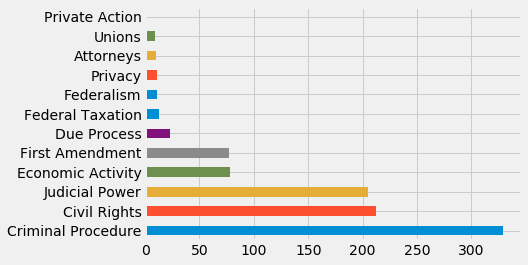

In [22]:
#Type of cases where decision is taken "per curiam"

data[data.decisionType==2]['mapissueArea'].value_counts().plot(kind='barh')

In [23]:
decision_dict = {1:'conservative',2:'liberal',3:"unspecifiable",9999:'Not Available'}

In [24]:
decisiontype_dict ={1:'opinion of the court (orally argued)',
2:'per curiam (no oral argument)',
4:'decrees',
5:'equally divided vote',
6:'per curiam (orally argued)',
7:'judgment of the Court (orally argued)',
8:'seriatim'}

In [28]:
import pandas_profiling

In [29]:
data.profile_report()